# easyshader: Examples

easyshader is a tool for rendering 3D scenes, exporting .ply files for 3D printing and creating animations, powered by Signed Distance Fields (SDFs) and written in Python/Taichi.

It was created to enable drawing 3D shapes using a very concise syntax, and is packed with 3D primitives, transformations and smooth operators.

# Basic usage

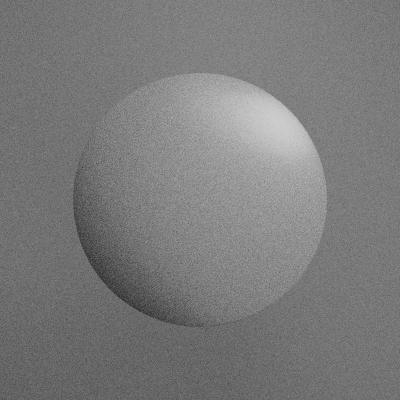

In [3]:
from easyshader import *

Sphere(1)

Use the "color" parameter to paint your object

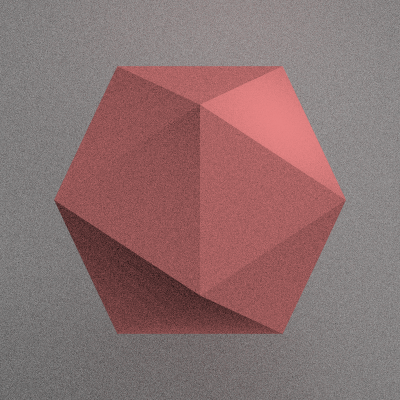

In [4]:
Icosahedron(1,'#f55')

# easyshader primitives

You can choose from the following primitives:

- Box
- BoxFrame
- Callable
- Cone
- Cyllinder
- Icosahedron
- Iterable
- Line
- Number
- Octahedron
- Shape
- Sphere
- Torus

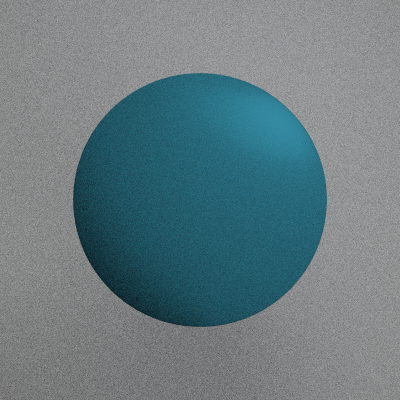

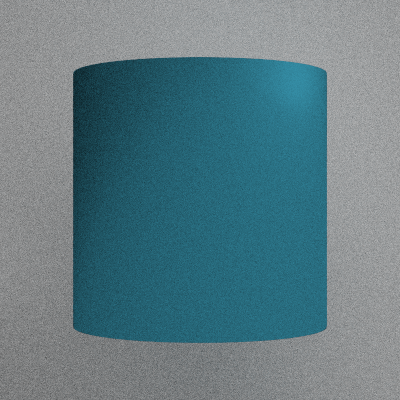

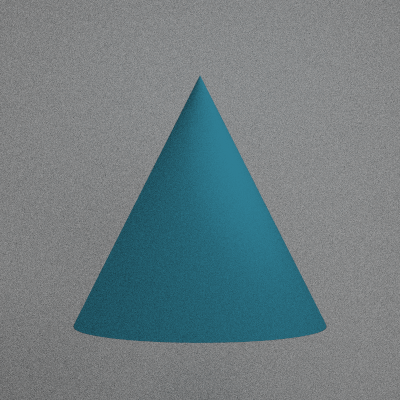

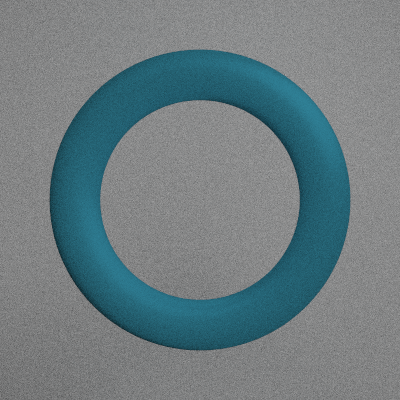

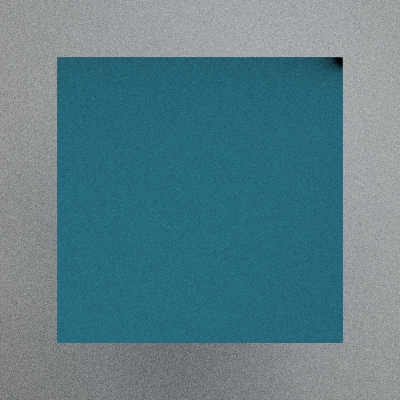

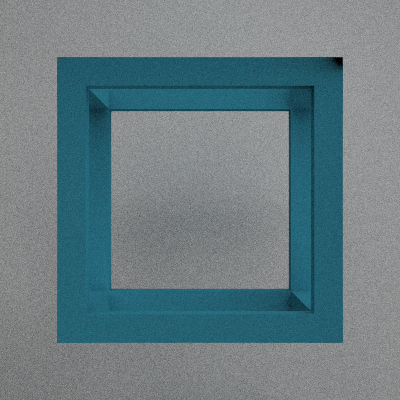

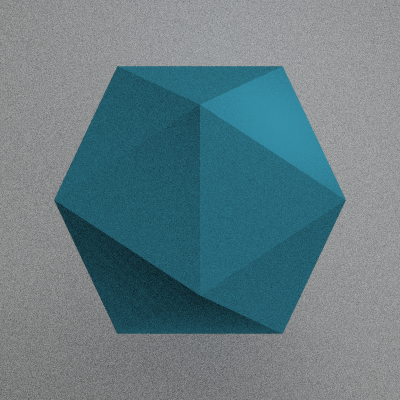

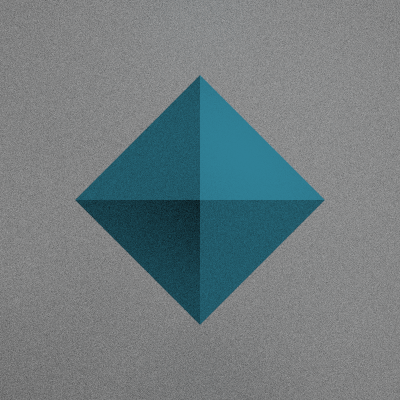

In [5]:
for obj in [Sphere(1), Cyllinder(1,1), Cone(1,2), Torus(1,.2), Box(1), BoxFrame(1,.1), Icosahedron(1), Octahedron(1)]:
    display(obj.paint('#0B4F6C'))

# Exporting to .ply for usage in Blender or 3D printing

Export your creations to polygon meshes for 3d printing or rendering on external apps (e.g. Blender)

In [ ]:
Icosahedron(1).to_mesh(simplify = 20, save_path='icosahedron.ply')

Color your creations using functions defined over x,y,z and a color palette:

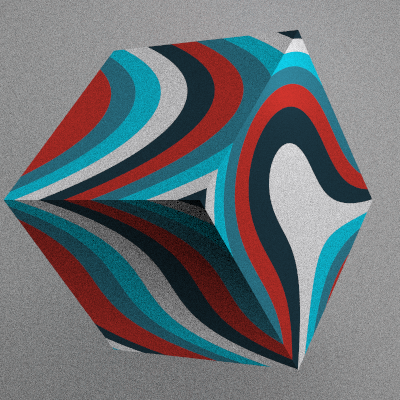

In [6]:
palette = ['#B80C09','#0B4F6C','#01BAEF','#FBFBFF','#040F16']

x = Box(.9, 'palette(4*(x+y**2+z**3))', palette = palette)
x = x.isometric()
x

# Binary operations

## Union:

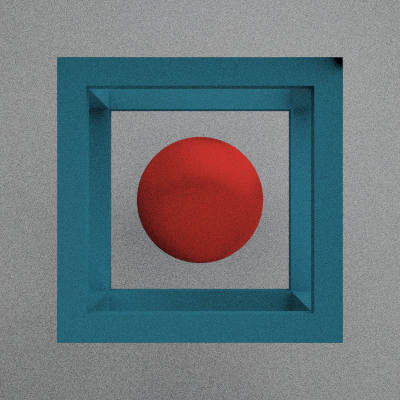

In [7]:
BoxFrame(1,.1,'#0B4F6C') + Sphere(.5,'#B80C09')

## Difference:

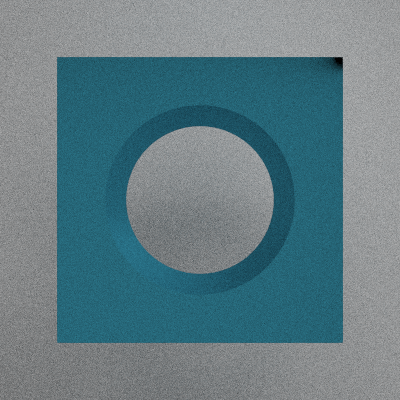

In [8]:
Box(1,'#0B4F6C') - Sphere(1.2)

## Intersection:

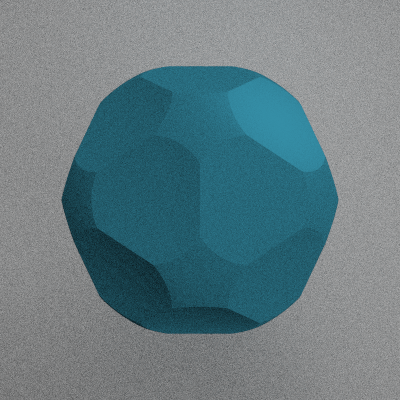

In [9]:
Icosahedron(1,'#0B4F6C') & Sphere(1.1)

# Examples

## A coffee cup!

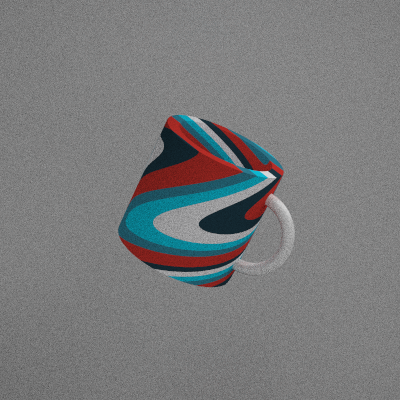

In [10]:
x = Sphere(1, 'palette(6*(x+y+z))', palette = palette)
x = x.twist(4)

x &= Cyllinder(.5,.5)
x -= Cyllinder(.4,.5) + 'dy .1'
x += (Torus(.3,.05) & Shape('-x')) + 'dx .5'
x = x.isometric()
x += 'rx -pi/3'

x

# Create videos!
Use the 't' (time) variable to control the animation

Animating..: 100%|██████████| 59/59 [00:52<00:00,  1.12it/s]


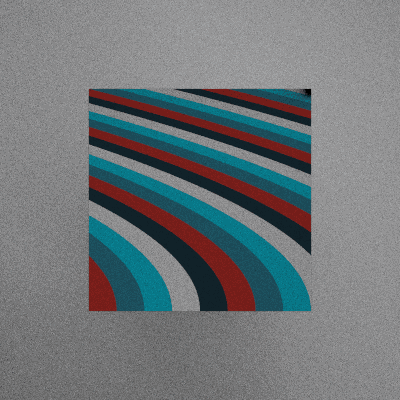

In [12]:
x = Box(1,'palette(4*((x+sin(t))+(y+cos(t))**2+z**3))',palette = palette)
x += 'ry t'
x += 'rx t'

x.animate(frames = 60, framerate = 15, iterations = 100)

# Transformations

## Translation

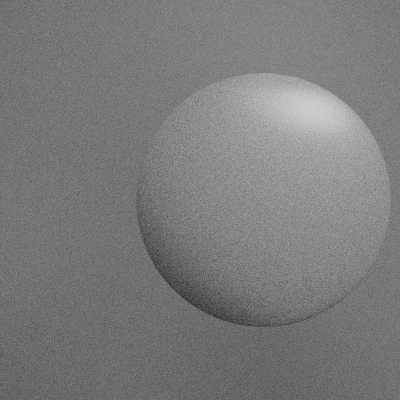

In [13]:
Sphere(1) + 'dx .5'

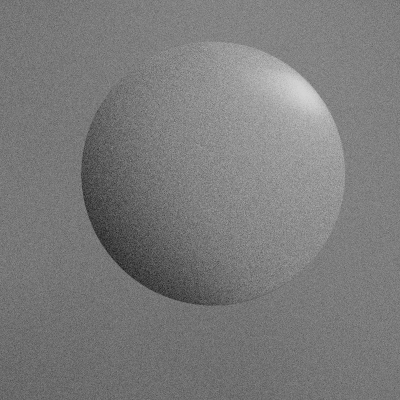

In [14]:
Sphere(1) + '(.1,.2,.3)'

## Scale

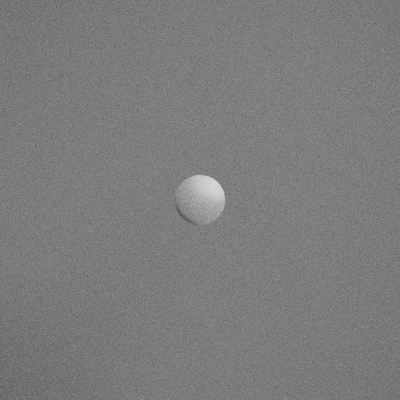

In [15]:
Sphere(1) * .2

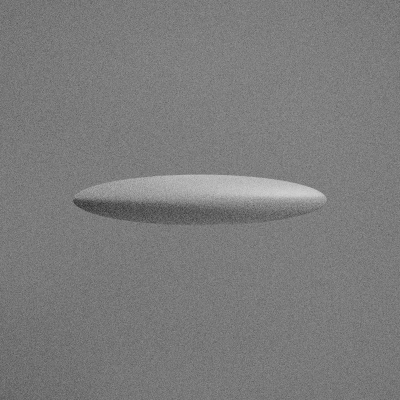

In [16]:
Sphere(1) * (1,.2,1)

## Rotation

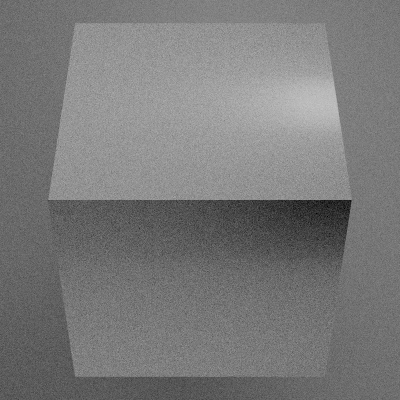

In [17]:
Box(1) + 'rx pi/4'

## Advanced transformations

You can use x,y,z (and the time parameter, t) as variables in transformations such as translation, rotation, scale

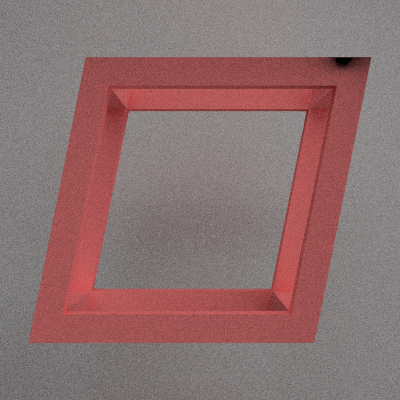

In [22]:
BoxFrame(1,.1,'#f44') + 'dx .2*y'

# Other operations

## Twist along an axis

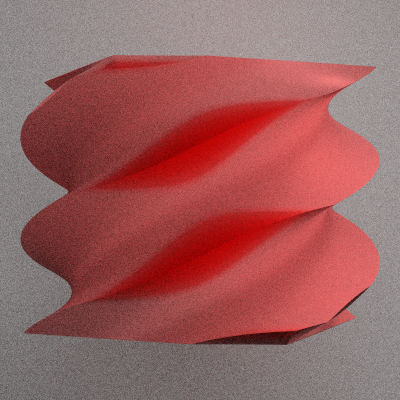

In [24]:
Box(1,'#f44').twist(2,'y')

## Create an "onion" shape

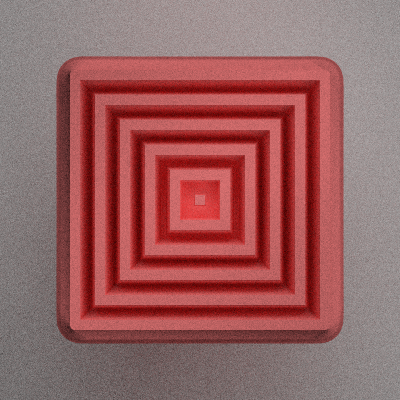

In [25]:
# Create an onion from a box
x = Box(1,'#f44').onion()
# Cut a hole in the onion
x &= Shape('z')

x

# Smooth operators

## Smooth union

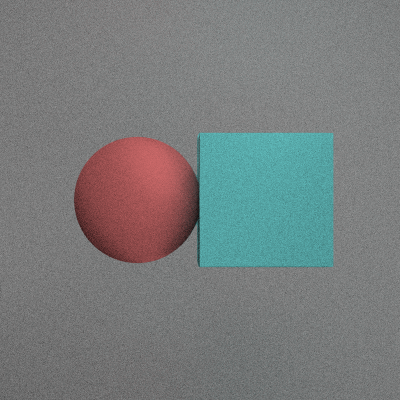

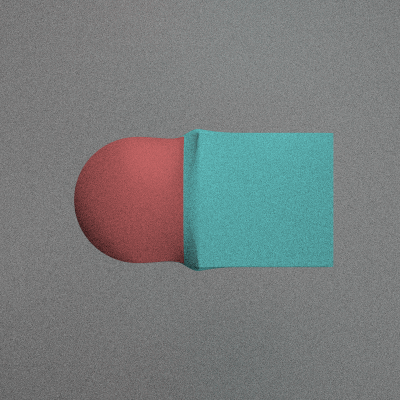

In [37]:
sphere = (Sphere(.5,'#f44') + 'dx -.5')
box = (Box(.5,'#4ff') + 'dx +.5')

# Normal union
display(sphere + box)

# Smooth union
display(sphere <<su(.5)>> box)

## Smooth difference

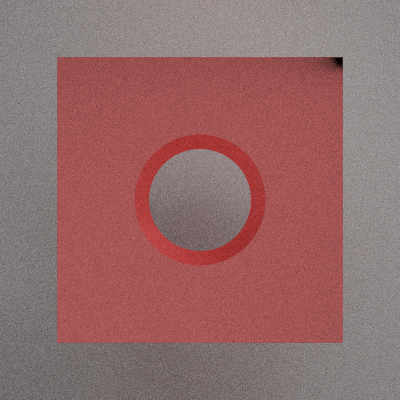

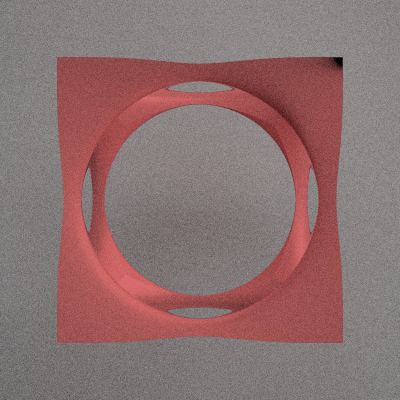

In [40]:
sphere = Sphere(1.1)
box = Box(1,'#f44')

# Normal difference
display(box - sphere)

# Smooth difference
display(box <<sd(.5)>> sphere)

## Smooth intersection

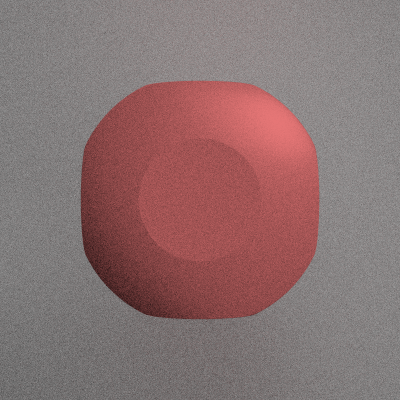

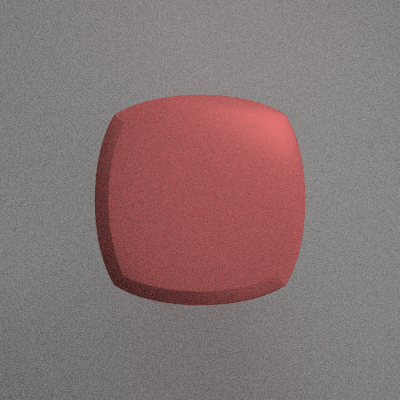

In [44]:
sphere = Sphere(1)
box = Box(.9,'#f44')

# Normal intersection
display(box & sphere)

# Smooth intersection
display(box <<si(.5)>> sphere)